# This notebook was used to perform the standardization of the dataset

In [10]:
import os
import pandas as pd
from PIL import Image
import numpy as np
from scipy.ndimage import zoom
from pathlib import Path
import re


In [6]:
ssd_path = "/Volumes/PortableSSD/PDS_eugenie"

image_path = f"{ssd_path}/Fonds 2021/10-13 ans 2021/2021_10-13_0539_TWN_R_C.jpg"
image_path2 = f"{ssd_path}/Fonds 2021/10-13 ans 2021/2021_10-13_0548_CHI_R_C.jpg"
image_path3 = f"{ssd_path}/Fonds 2021/3-5 ans 2021/2021_3-5_0906_THA_R_C.jpg"
image_path4 = f"{ssd_path}/Fonds 2020/14-17 ans 2020/2020_14-17_0492_UKR_R_C.jpg"
image_path5 = f"{ssd_path}/Fonds 2020/14-17 ans 2020/2020_14-17_0511_UKR_R_C.jpg"

df = pd.read_csv(os.path.join(ssd_path, "table_database.csv"))
df_sample = df.sample(n=100, random_state=42)
df_sample.to_csv(os.path.join(ssd_path, "table_database_sample.csv"), index=False)

# Resizing and cropping functions

In [8]:
def resize_images(input_folder, output_folder, extensions=('.jpg', '.jpeg', '.png')):
    """
    Resizes all images in input_folder to reach the mean pixel count (w*h)
    calculated over the folder, preserving aspect ratio. 
    """
    input_folder = Path(input_folder)
    output_folder = Path(output_folder)
    os.makedirs(output_folder, exist_ok=True)

    # Collect paths and pixel counts
    img_paths = []
    pixel_counts = []
    for p in input_folder.iterdir():
        if not p.is_file():
            continue
        if p.suffix.lower() not in extensions:
            continue
        if p.name.startswith('._'):
            continue
        try:
            with Image.open(p) as im:
                w, h = im.size
            if w <= 0 or h <= 0:
                print(f"Skip (invalid dimensions): {p.name}")
                continue
            img_paths.append(p)
            pixel_counts.append(w * h)
        except Exception as e:
            print(f"Warning: cannot open {p.name}: {e}")

    if len(img_paths) == 0:
        raise RuntimeError(f"No valid images found in {input_folder} (extensions={extensions})")

    mean_pixels = int(np.mean(pixel_counts))
    print(f"Images found: {len(img_paths)} — mean pixel count: {mean_pixels}")

    # Resize each image (cubic spline)
    saved = 0
    errors = 0
    for p in img_paths:
        try:
            with Image.open(p) as im:
                im = im.convert('RGB')
                w, h = im.size
                ratio = w / h if h != 0 else 1.0

                new_h = int(np.sqrt(mean_pixels / ratio))
                new_w = int(ratio * new_h)
                new_h = max(1, new_h)
                new_w = max(1, new_w)

                arr = np.array(im, dtype=np.float32)
                hz = new_h / h
                wz = new_w / w
                zoom_factors = (hz, wz, 1.0)

                # Cubic spline interpolation (order=3)
                try:
                    resized_np = zoom(arr, zoom_factors, order=3)
                except Exception as e:
                    print(f"Warning: cubic zoom failed for {p.name} ({e}), fallback order=1")
                    resized_np = zoom(arr, zoom_factors, order=1)

                resized_img = Image.fromarray(np.clip(resized_np, 0, 255).astype('uint8'))

                out_path = output_folder / p.name
                resized_img.save(out_path)
                saved += 1
        except Exception as e:
            print(f"Error processing {p.name}: {e}")
            errors += 1

    print(f"Done. Images processed: {len(img_paths)}, saved: {saved}, errors: {errors}")
    return {"count_found": len(img_paths), "saved": saved, "errors": errors, "mean_pixels": mean_pixels}

def reframe_border(image, threshold=40, border_width=1, black_ratio=0.95):
  
    img_np = np.array(image.convert("RGB"))
    h, w = img_np.shape[:2]

    # Helper to check if a strip is mostly black
    def is_black_strip(strip):
        gray = np.mean(strip, axis=2)
        black_pixels = np.mean(gray <= threshold)
        return black_pixels >= black_ratio

    # Top
    top = 0
    for i in range(h):
        strip = img_np[i:i+border_width, :, :]
        if not is_black_strip(strip):
            top = i
            break
    # Bottom
    bottom = h
    for i in range(h-1, -1, -1):
        strip = img_np[max(i-border_width+1,0):i+1, :, :]
        if not is_black_strip(strip):
            bottom = i + 1
            break
    # Left
    left = 0
    for j in range(w):
        strip = img_np[:, j:j+border_width, :]
        if not is_black_strip(strip):
            left = j
            break
    # Right
    right = w
    for j in range(w-1, -1, -1):
        strip = img_np[:, max(j-border_width+1,0):j+1, :]
        if not is_black_strip(strip):
            right = j + 1
            break

    cropped = img_np[top:bottom, left:right]
    from PIL import Image
    return Image.fromarray(cropped)

def crop_images(input_folder, output_folder, extensions=('.jpg', '.jpeg', '.png'), 
                threshold=40, border_width=1, black_ratio=0.95):
    """
    Applies reframe_border to all images in input_folder to remove black borders.
    """
    input_folder = Path(input_folder)
    output_folder = Path(output_folder)
    os.makedirs(output_folder, exist_ok=True)

    # Collect image paths
    img_paths = []
    for p in input_folder.iterdir():
        if not p.is_file():
            continue
        if p.suffix.lower() not in extensions:
            continue
        if p.name.startswith('._'):
            continue
        img_paths.append(p)

    if len(img_paths) == 0:
        raise RuntimeError(f"No valid images found in {input_folder} (extensions={extensions})")

    print(f"Images found: {len(img_paths)}")

    # Process each image
    saved = 0
    errors = 0
    for p in img_paths:
        try:
            with Image.open(p) as im:
                cropped_img = reframe_border(im, threshold, border_width, black_ratio)
                
                out_path = output_folder / p.name
                cropped_img.save(out_path)
                saved += 1
        except Exception as e:
            print(f"Error processing {p.name}: {e}")
            errors += 1

    print(f"Done. Images processed: {len(img_paths)}, saved: {saved}, errors: {errors}")
    return {"count_found": len(img_paths), "saved": saved, "errors": errors}

# Testing of the cropping function

original and cropped images:


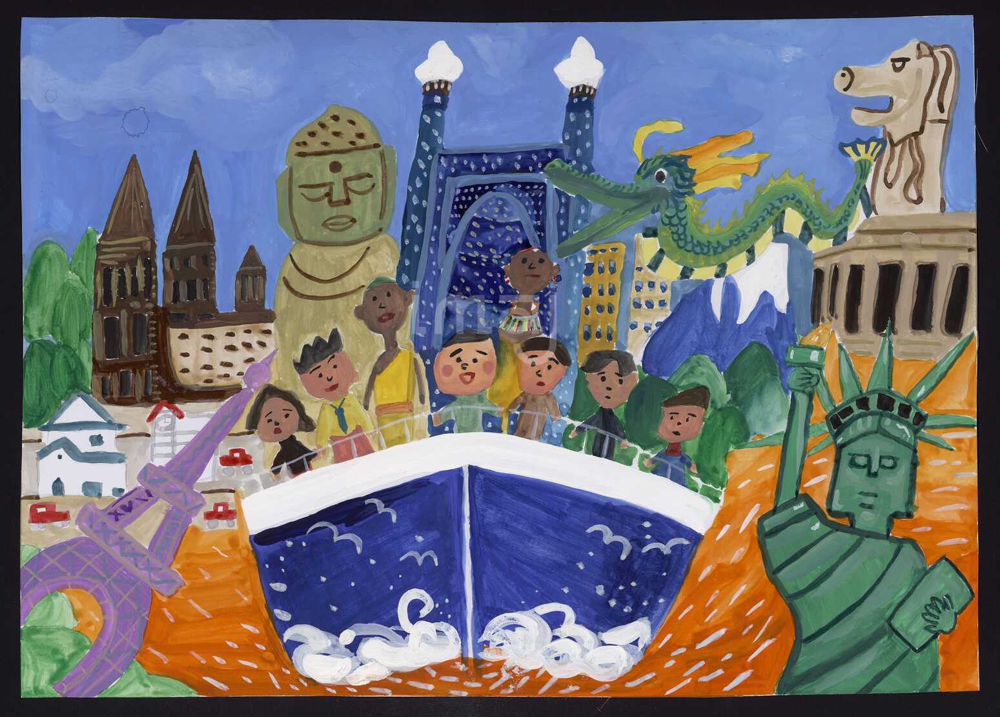

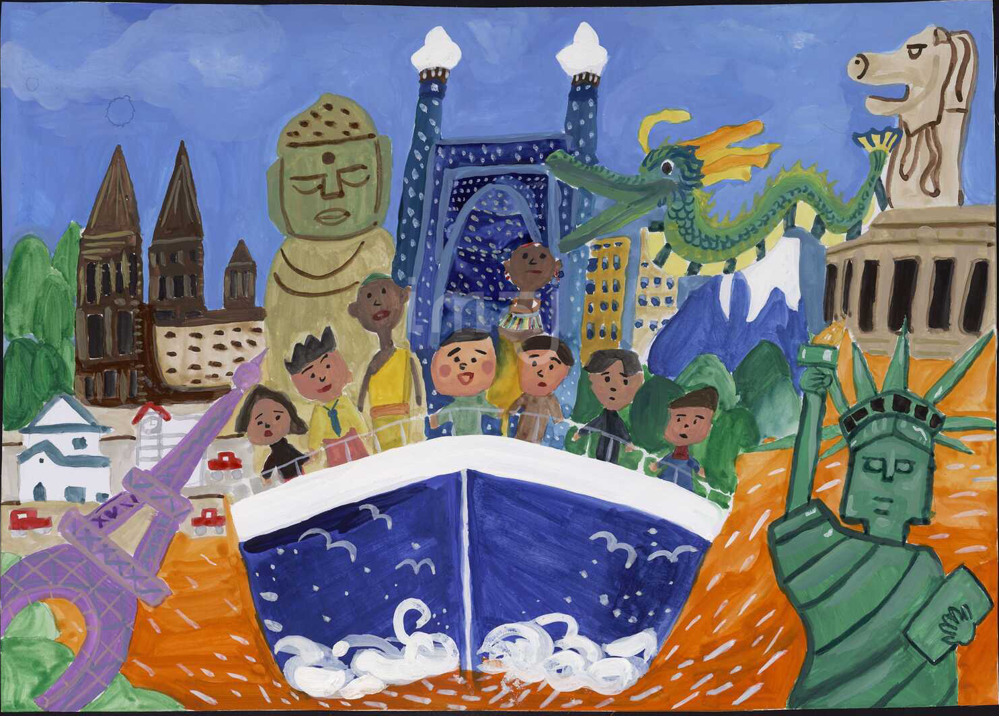

original and cropped images:


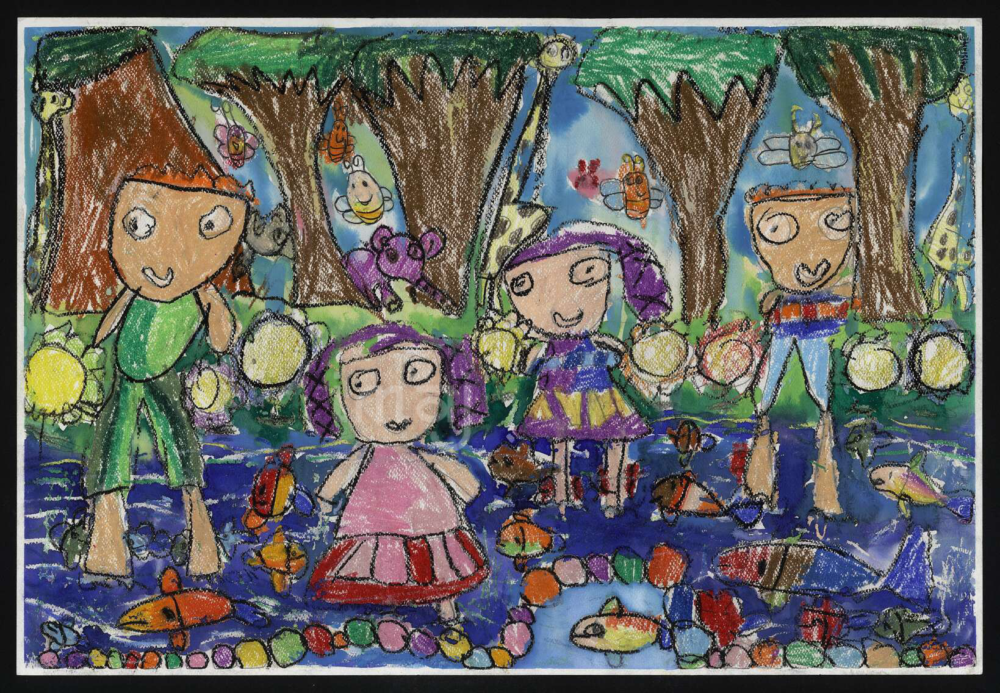

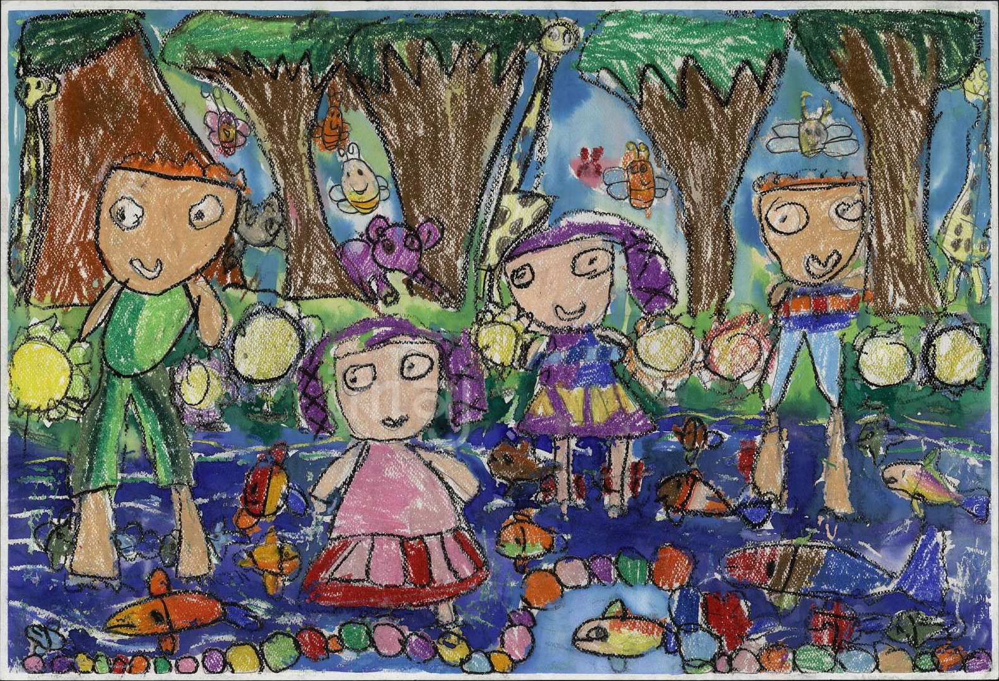

In [5]:
ssd_path = "/Volumes/PortableSSD/PDS_eugenie"
image_path2 = f"{ssd_path}/Fonds 2021/10-13 ans 2021/2021_10-13_0548_CHI_R_C.jpg"
image_path3 = f"{ssd_path}/Fonds 2021/3-5 ans 2021/2021_3-5_0906_THA_R_C.jpg"

print("original and cropped images:")
image2=Image.open(image_path2).convert("RGB")
display(image2)
image_cropped2 = reframe_border(image2)
display(image_cropped2)

print("original and cropped images:")
image3=Image.open(image_path3).convert("RGB")
display(image3)
image_cropped3 = reframe_border(image3)
display(image_cropped3)

# Run the resizing and the cropping fuctions on the entire dataset

In [9]:
input_folder =  f"{ssd_path}/filtered_dataset"
output_folder = f"{ssd_path}/filtered_dataset_cropped"
crop_images(input_folder, output_folder)

input_folder =  f"{ssd_path}/filtered_dataset_cropped"
output_folder = f"{ssd_path}/filtered_dataset_resized"
resize_images(input_folder, output_folder)

KeyboardInterrupt: 

# Standardization of the "Medico-Social" nomenclature

In [11]:
import re
from pathlib import Path

filtered_dir = Path("/Volumes/PortableSSD/PDS_eugenie/filtered_dataset")

# Pattern to normalize "Médico-social" variants to "MS"
_boundary_left = r"(?<![A-Za-z0-9])"
_boundary_right = r"(?![A-Za-z0-9])"
full_form = r"M[ÉE]D[IÍ]C[OÓ]?\s*(?:-|_)?\s*SOCIAL"
short_forms = r"M[ÉE]D[IÍ]C[OÓ]?|M[ÉE]D[IÍ]C|M[ÉE]D[IÍ]|M\s*\-\s*S"
MS_PATTERN = re.compile(fr"(?i){_boundary_left}(?:{full_form}|{short_forms}){_boundary_right}")

def normalize_ms(text: str) -> str:
    if not isinstance(text, str):
        return text
    return MS_PATTERN.sub("MS", text)

def resolve_collision(path: Path) -> Path:
    if not path.exists():
        return path
    stem, suffix = path.stem, path.suffix
    i = 1
    while True:
        candidate = path.parent / f"{stem}_dup{i}{suffix}"
        if not candidate.exists():
            return candidate
        i += 1

renamed, skipped = 0, 0
for file in filtered_dir.iterdir():
    if not file.is_file():
        continue
    new_name = normalize_ms(file.name)
    if new_name != file.name:
        target = filtered_dir / new_name
        target = resolve_collision(target)
        try:
            file.rename(target)
            print(f"Renamed: {file.name} -> {target.name}")
            renamed += 1
        except Exception as e:
            print(f"Error renaming {file.name}: {e}")
            skipped += 1

print(f"Done. Files renamed: {renamed}, errors: {skipped}")

KeyboardInterrupt: 